In [1]:
library(tidyverse)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors


In [2]:
getwd()

[1] "/fast/AG_Bunina/Yusuf/Project_Endothelial_and_Stroke/Datasets/Chromatin_and_Gene_Exp/2023_Zhu_et_al/Zhu_et_al_2023/24_09_24"

In [3]:
here::here()

[1] "/fast/AG_Bunina/Yusuf/Project_Endothelial_and_Stroke/Datasets/Chromatin_and_Gene_Exp/2023_Zhu_et_al/Zhu_et_al_2023/24_09_24"

In [4]:
library(Seurat)

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, t




In [5]:
library(Signac)

In [6]:
library(Pando)


Attaching package: ‘Pando’


The following objects are masked from ‘package:Seurat’:

    GetAssay, VariableFeatures


The following objects are masked from ‘package:SeuratObject’:

    LayerData, VariableFeatures




In [7]:
list.files(here::here('R_Objects')) %>% print

 [1] "DE_data_sig_EC.RDS"                  
 [2] "EC_detected_peaks_min1.RDS"          
 [3] "EC_detected_peaks_min5.RDS"          
 [4] "endothelial_genes_subsetted.RDS"     
 [5] "endothelial_genes.RDS"               
 [6] "important_TFs_EC_min1.RDS"           
 [7] "important_TFs_EC_min5.RDS"           
 [8] "Zhu_et_al_eGRNs_combined.RDS"        
 [9] "Zhu_et_al_Pando_w_eGRNs_SLURM_c1.RDS"
[10] "Zhu_et_al_Pando_w_eGRNs_SLURM_c2.RDS"
[11] "Zhu_et_al_Pando_w_eGRNs_SLURM_c3.RDS"
[12] "Zhu_et_al_Pando_w_eGRNs_SLURM_c4.RDS"
[13] "Zhu_et_al_Pando_w_eGRNs_SLURM_c5.RDS"
[14] "Zhu_et_al_Pando_w_eGRNs_SLURM_c6.RDS"
[15] "Zhu_et_al_Pando_w_motifs.RDS"        


In [8]:
Zhu_et_al_eGRNs_combined <- 
    readRDS(here::here('R_Objects', 'Zhu_et_al_eGRNs_combined.RDS'))

In [9]:
Zhu_et_al_eGRNs_combined

An object of class "GRNData"
Slot "grn":
A RegulatoryNetwork object based on 1014 transcription factors

1 inferred network: glm_network

Slot "data":
An object of class Seurat 
364381 features across 45549 samples within 3 assays 
Active assay: SCT (30146 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 2 other assays present: RNA, peaks
 7 dimensional reductions calculated: pca, umap.rna, lsi, umap.atac, wnn.umap, pca.harmony, lsi.harmony


In [11]:
EC_detected_peaks_min1 <- 
    readRDS(here::here('R_Objects', 'EC_detected_peaks_min1.RDS'))

In [12]:
EC_detected_peaks_min1 %>% length

[1] 144345

In [17]:
EC_eGRN_min1_Zhu_et_al <- Zhu_et_al_eGRNs_combined

In [18]:
EC_eGRN_min1_Zhu_et_al@grn@networks$glm_network@coefs <- 
                EC_eGRN_min1_Zhu_et_al@grn@networks$glm_network@coefs %>% 
                            filter(region %in% EC_detected_peaks_min1)

In [20]:
coef(EC_eGRN_min1_Zhu_et_al) %>% dim

[1] 11159    11

In [21]:
coef(Zhu_et_al_eGRNs_combined) %>% dim

[1] 919602     11

In [22]:
EC_eGRN_min1_Zhu_et_al  <- find_modules(
    EC_eGRN_min1_Zhu_et_al, 
    p_thresh = 0.1,
    nvar_thresh = 2, 
    min_genes_per_module = 1, 
    rsq_thresh = 0.05
)

Found 250 TF modules



In [23]:
mannens_data_dir <- 
"/fast/AG_Bunina/Yusuf/Project_Endothelial_and_Stroke/Datasets/Chromatin_and_Gene_Exp/2024_C_A_Mannens_C_et_al"

In [24]:
EC_eGRN_min5_Mannens_et_al <- 
    readRDS(file.path(mannens_data_dir, 'R_Objects', 'EC_eGRN_min5_Pando_obj.RDS'))

In [25]:
EC_eGRN_min5_Mannens_et_al

An object of class "GRNData"
Slot "grn":
A RegulatoryNetwork object based on 1122 transcription factors

1 inferred network: glm_network

Slot "data":
An object of class Seurat 
430192 features across 49470 samples within 2 assays 
Active assay: RNA (25071 features, 5000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: peaks


In [26]:
NetworkModules(EC_eGRN_min5_Mannens_et_al) %>% .@meta %>% head

tf,target,estimate,n_regions,n_genes,n_tfs,regions,pval,padj
<chr>,<chr>,<dbl>,<int>,<int>,<int>,<chr>,<dbl>,<dbl>
ADNP,CADM1,0.05979197,28,2,34,chr11-115449145-115449546,6.661690e-03,0.0765062521
ADNP,LINC00461,0.05063886,38,2,63,chr5-87785903-87786304,5.444198e-03,0.0663392978
ALX4,COL5A2,0.14479145,2,7,7,chr2-189149967-189150368,3.963748e-03,0.0526620919
ALX4,DENND2A,0.41962847,3,7,5,chr7-139943337-139943738,4.362366e-03,0.0564851602
ALX4,EBF1,-0.84473061,27,7,36,chr5-158202046-158202447,4.302490e-03,0.0559197623
ALX4,HEY2,0.28985015,3,7,4,chr6-126143915-126144316,2.261550e-06,0.0001066292


In [27]:
EC_eGRN_min1_Zhu_et_al %>% NetworkModules %>% .@meta %>% head

tf,target,estimate,n_regions,n_genes,n_tfs,regions,pval,padj
<chr>,<chr>,<dbl>,<int>,<int>,<int>,<chr>,<dbl>,<dbl>
AEBP2,ATP2B1,0.02486657,4,10,3,chr12-89707060-89707304,0.0080975973,0.061764430
AEBP2,CAMK1D,0.03421972,1,10,1,chr10-12699395-12699595,0.0006356896,0.008522961
AEBP2,CNTNAP2,0.06680273,1,10,1,chr7-148809909-148810164,0.0025240192,0.025500072
AEBP2,DMD,0.05752384,1,10,1,chrX-30992379-30992751,0.0034976167,0.032788445
AEBP2,NHSL1,-0.03879838,1,10,2,chr6-139588999-139589637,0.0006404508,0.008575795
AEBP2,PLCB1,0.07657219,3,10,3,chr20-9945452-9945665,0.0033085371,0.031437162


In [29]:
common_targets <- 
    intersect(unique(EC_eGRN_min1_Zhu_et_al@grn@networks$glm_network@modules@meta$target), 
              unique(EC_eGRN_min5_Mannens_et_al@grn@networks$glm_network@modules@meta$target))

In [30]:
common_targets %>% length

[1] 274

In [31]:
common_TFs <- 
    intersect(unique(EC_eGRN_min1_Zhu_et_al@grn@networks$glm_network@modules@meta$tf), 
              unique(EC_eGRN_min5_Mannens_et_al@grn@networks$glm_network@modules@meta$tf))

In [32]:
common_TFs %>% length

[1] 202

In [33]:
# load network visualization functions:

source(here::here('network_visualization_functions.r'))

make sure you installed the GGally, network, igraph and ggraph packages :)

First option: One can directly use only the node_names parameter to specify 
          the gene names to visualize in the graph

Second option: Use TF-names and/or target genes parameters 
         to visualize their connections

Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2


‘network’ 1.18.2 (2023-12-04), part of the Statnet Project
* ‘news(package="network")’ for changes since last version
* ‘citation("network")’ for citation information
* ‘https://statnet.org’ for help, support, and other information



Attaching package: ‘igraph’


The following objects are masked from ‘package:network’:

    %c%, %s%, add.edges, add.vertices, delete.edges, delete.vertices,
    get.edge.attribute, get.edges, get.vertex.attribute, is.bipartite,
    is.directed, list.edge.attributes, list.vertex.attributes,
    set.edge.attribute, set.vertex.attribute


The following object is masked from ‘p

In [34]:
options(repr.plot.width = 30, repr.plot.height = 24) # for network.

 Network attributes:
  vertices = 401 
  directed = TRUE 
  hyper = FALSE 
  loops = FALSE 
  multiple = FALSE 
  bipartite = FALSE 
  total edges= 696 
    missing edges= 0 
    non-missing edges= 696 

 Vertex attribute names: 
    vertex.names 

No edge attributes


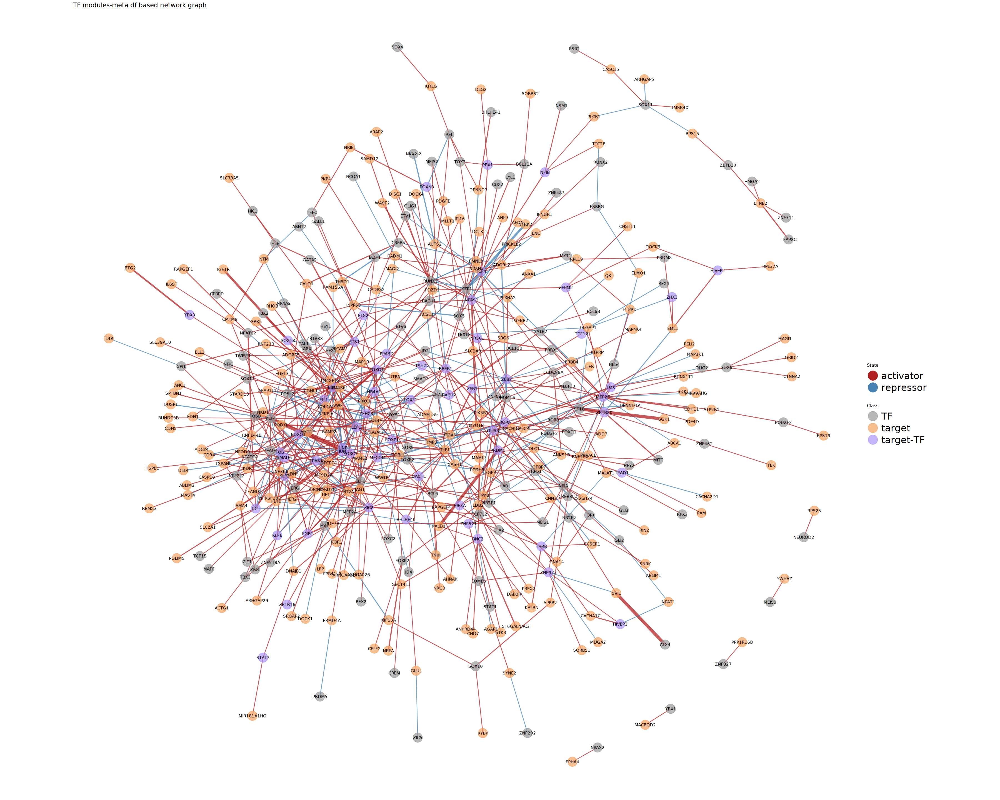

In [35]:
vis_network_w_GGNET2(meta_DF = NetworkModules(EC_eGRN_min1_Zhu_et_al)@meta, 
                     TF_names = common_TFs,
                     target_genes = common_targets)

 Network attributes:
  vertices = 416 
  directed = TRUE 
  hyper = FALSE 
  loops = FALSE 
  multiple = FALSE 
  bipartite = FALSE 
  total edges= 1659 
    missing edges= 0 
    non-missing edges= 1659 

 Vertex attribute names: 
    vertex.names 

 Edge attribute names not shown 


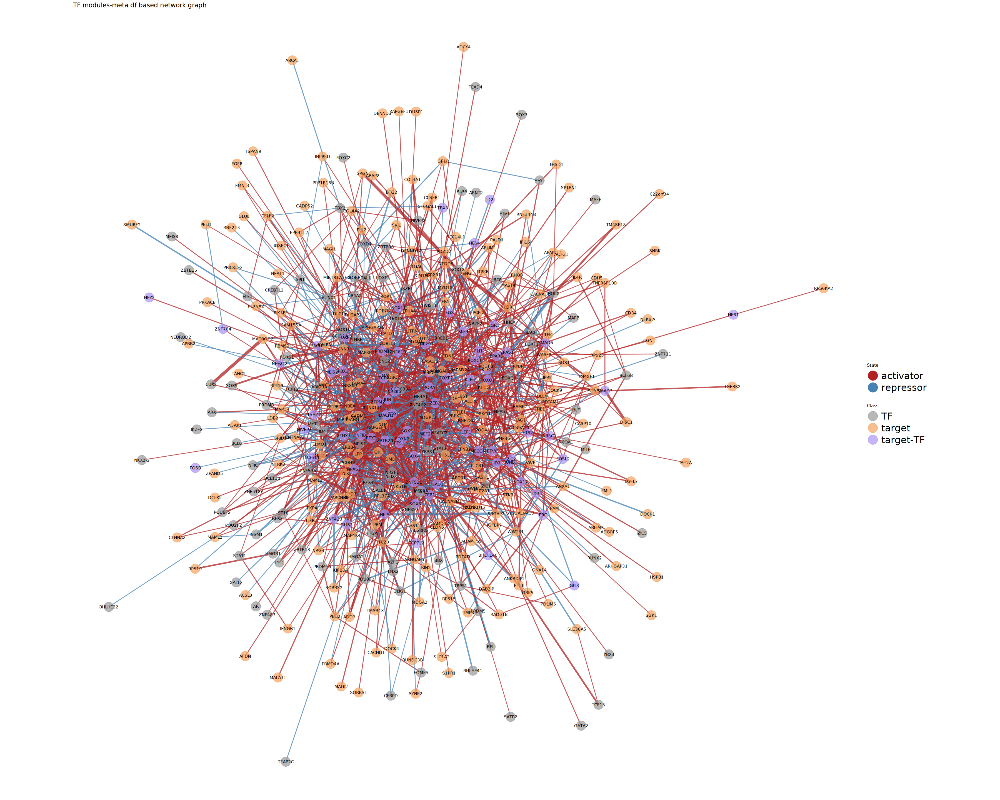

In [36]:
vis_network_w_GGNET2(meta_DF = NetworkModules(EC_eGRN_min5_Mannens_et_al)@meta, 
                     TF_names = common_TFs,
                     target_genes = common_targets)

In [37]:
NetworkModules(EC_eGRN_min5_Mannens_et_al)@meta$estimate %>% summary

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
-2.10953 -0.02335  0.03888  0.03811  0.07657  1.72608 

In [38]:
NetworkModules(EC_eGRN_min1_Zhu_et_al)@meta$estimate %>% summary

     Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
-1.144340  0.009108  0.033609  0.040299  0.066653  1.874883 

In [39]:
common_targets %>% print

  [1] "ATP2B1"     "CNTNAP2"    "DMD"        "NHSL1"      "PLCB1"     
  [6] "TSHZ2"      "TTC28"      "SVIL"       "EGFR"       "GLIS3"     
 [11] "TIMP3"      "INPP5D"     "FOXP1"      "NTM"        "NEAT1"     
 [16] "PDGFB"      "PRKCH"      "TGFBR2"     "FLI1"       "ADGRL2"    
 [21] "PBX1"       "SORBS2"     "BACH2"      "ADAMTS9"    "COL4A2"    
 [26] "NRG3"       "TNIK"       "WWTR1"      "SRGN"       "AHNAK"     
 [31] "TLE1"       "DENND3"     "AGAP1"      "ANKRD44"    "CHD7"      
 [36] "KALRN"      "MAML3"      "PALD1"      "PIK3R1"     "SEC14L1"   
 [41] "ST6GALNAC3" "STK3"       "ANKS1B"     "MALAT1"     "MAP4K4"    
 [46] "NRXN3"      "ZEB2"       "ADGRF5"     "APBB2"      "DLC1"      
 [51] "MEF2C"      "ZBTB20"     "ZNF521"     "CALD1"      "FAM155A"   
 [56] "NPAS3"      "SAMD12"     "TCF4"       "EPAS1"      "GPCPD1"    
 [61] "PARD3B"     "TIE1"       "CALCRL"     "CLDN5"      "EGFL7"     
 [66] "ETS1"       "GRK5"       "JUNB"       "LEF1"       "MECOM"     
 [71] 

 Network attributes:
  vertices = 26 
  directed = TRUE 
  hyper = FALSE 
  loops = FALSE 
  multiple = FALSE 
  bipartite = FALSE 
  total edges= 23 
    missing edges= 0 
    non-missing edges= 23 

 Vertex attribute names: 
    vertex.names 

No edge attributes


Scale for size is already present.
Adding another scale for size, which will replace the existing scale.


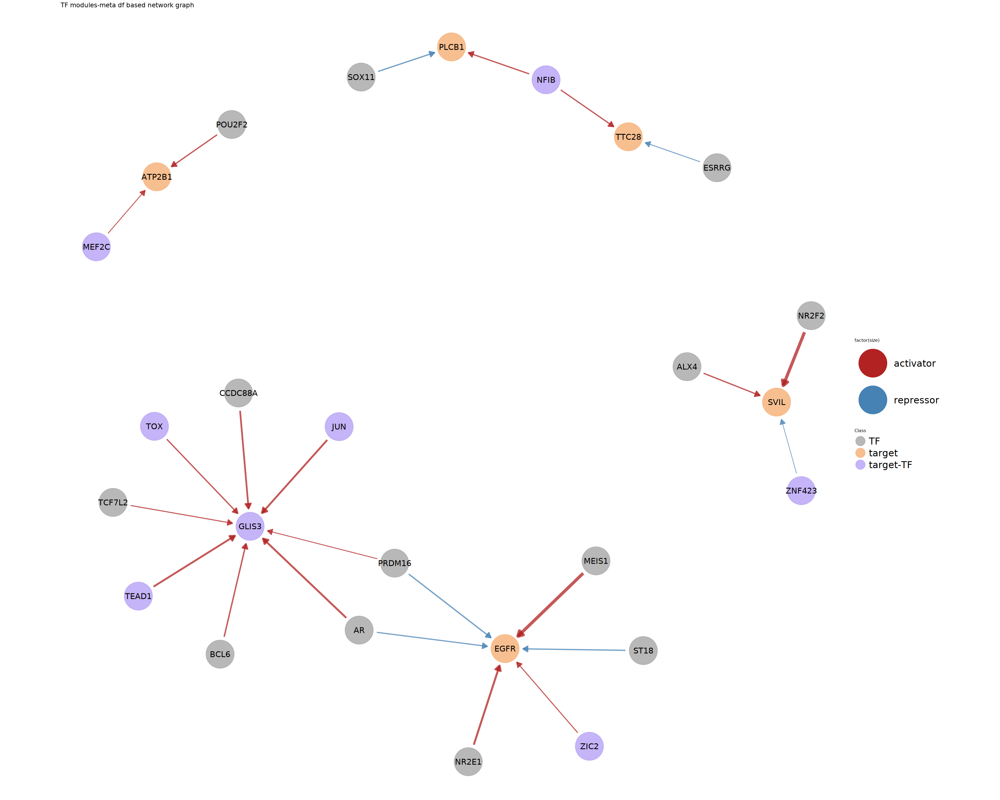

In [44]:
vis_subnetwork_w_GGNET2(meta_DF = NetworkModules(EC_eGRN_min1_Zhu_et_al)@meta, 
                     arrow = TRUE,
                     TF_names = common_TFs,
                     target_genes = common_targets[1:10])

 Network attributes:
  vertices = 52 
  directed = TRUE 
  hyper = FALSE 
  loops = FALSE 
  multiple = FALSE 
  bipartite = FALSE 
  total edges= 53 
    missing edges= 0 
    non-missing edges= 53 

 Vertex attribute names: 
    vertex.names 

No edge attributes


Scale for size is already present.
Adding another scale for size, which will replace the existing scale.


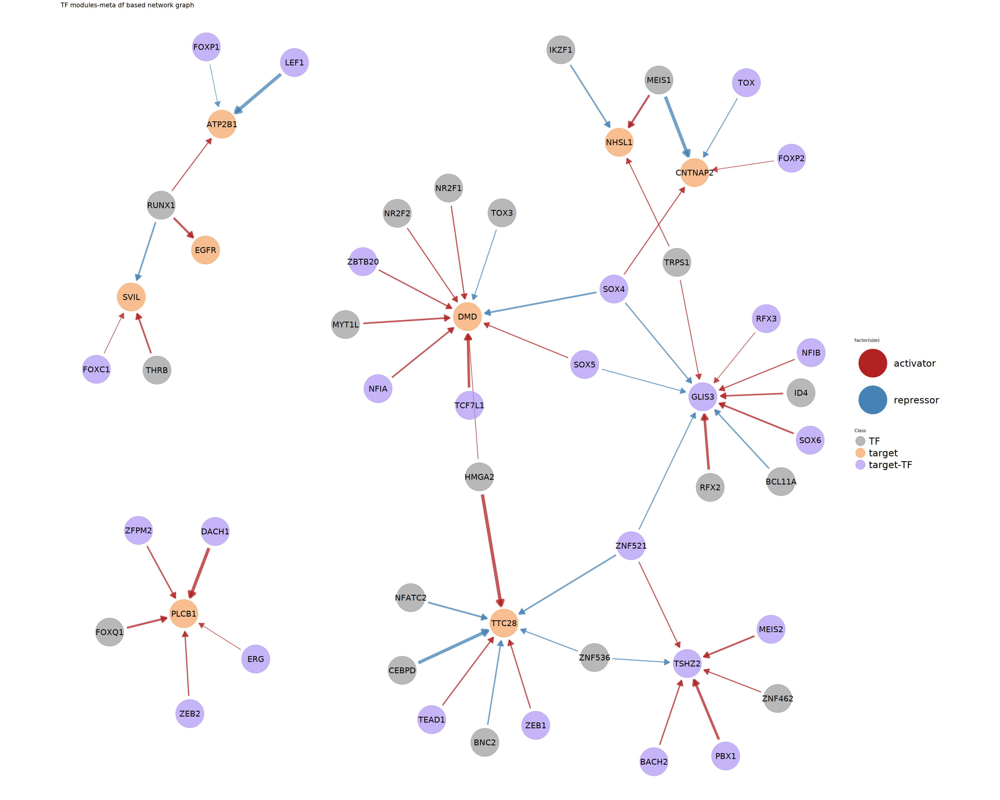

In [45]:
vis_subnetwork_w_GGNET2(meta_DF = NetworkModules(EC_eGRN_min5_Mannens_et_al)@meta, 
                     TF_names = common_TFs,
                     arrow = TRUE,
                     target_genes = common_targets[1:10])

In [47]:
common_TFs %>% print

  [1] "ALX4"    "AR"      "ARID3A"  "ARNT2"   "ARX"     "BACH1"   "BACH2"  
  [8] "BBX"     "BCL11A"  "BCL11B"  "BCL6"    "BCL6B"   "BHLHE22" "BHLHE40"
 [15] "BHLHE41" "BNC2"    "CCDC88A" "CEBPD"   "CREB3L2" "CREB5"   "CREM"   
 [22] "CUX2"    "DACH1"   "EBF1"    "EGR1"    "ELF1"    "EOMES"   "EPAS1"  
 [29] "ERG"     "ESR2"    "ESRRG"   "ETS1"    "ETS2"    "ETV1"    "ETV6"   
 [36] "FLI1"    "FOS"     "FOSB"    "FOSL2"   "FOXC1"   "FOXC2"   "FOXD1"  
 [43] "FOXF1"   "FOXF2"   "FOXN3"   "FOXO1"   "FOXP1"   "FOXP2"   "FOXQ1"  
 [50] "FOXS1"   "GATA2"   "GLI2"    "GLI3"    "GLIS3"   "HES1"    "HES4"   
 [57] "HEY2"    "HEYL"    "HHEX"    "HIC1"    "HIF3A"   "HIVEP2"  "HIVEP3" 
 [64] "HLF"     "HMGA2"   "HMGB1"   "HOPX"    "ID1"     "ID2"     "ID3"    
 [71] "ID4"     "IKZF1"   "IKZF2"   "INSM1"   "IRF8"    "JAZF1"   "JUN"    
 [78] "JUNB"    "KLF2"    "KLF4"    "KLF6"    "LEF1"    "LHX2"    "LYL1"   
 [85] "MAF"     "MAFB"    "MAFF"    "MECOM"   "MEF2A"   "MEF2C"   "MEIS1"  
 [92] "MEIS2

For the common target genes, find the overlapping TFs, contingency table like summary table\
to check the consistent connections. Analyze another multiome dataet with comparable coverage of\
genome.

 Network attributes:
  vertices = 11 
  directed = TRUE 
  hyper = FALSE 
  loops = FALSE 
  multiple = FALSE 
  bipartite = FALSE 
  total edges= 10 
    missing edges= 0 
    non-missing edges= 10 

 Vertex attribute names: 
    vertex.names 

No edge attributes


Scale for size is already present.
Adding another scale for size, which will replace the existing scale.


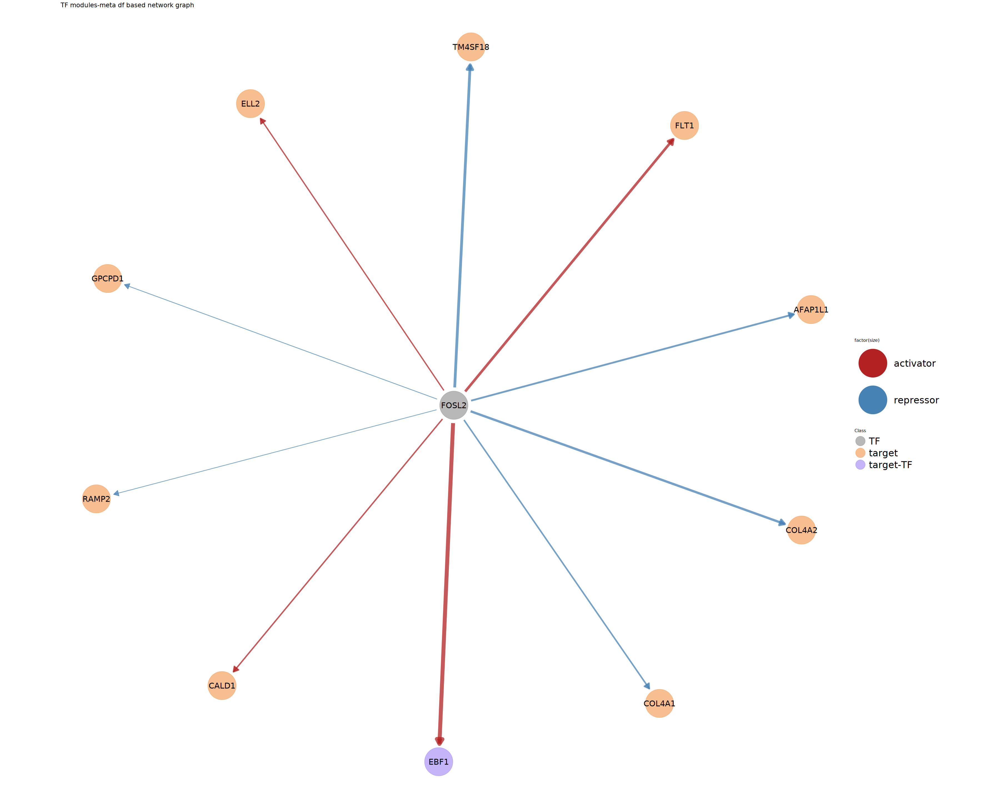

In [48]:
vis_subnetwork_w_GGNET2(meta_DF = NetworkModules(EC_eGRN_min1_Zhu_et_al)@meta, 
                     arrow = TRUE,
                     TF_names = 'FOSL2',
                     target_genes = common_targets)

 Network attributes:
  vertices = 8 
  directed = TRUE 
  hyper = FALSE 
  loops = FALSE 
  multiple = FALSE 
  bipartite = FALSE 
  total edges= 7 
    missing edges= 0 
    non-missing edges= 7 

 Vertex attribute names: 
    vertex.names 

No edge attributes


Scale for size is already present.
Adding another scale for size, which will replace the existing scale.


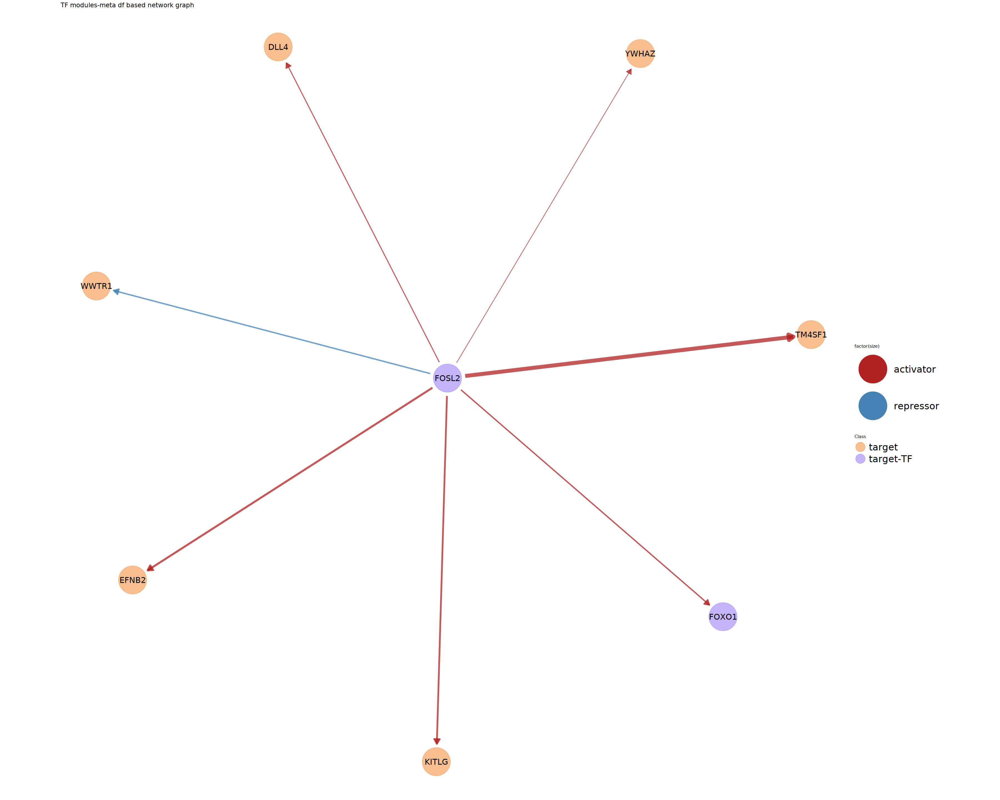

In [49]:
vis_subnetwork_w_GGNET2(meta_DF = NetworkModules(EC_eGRN_min5_Mannens_et_al)@meta, 
                     arrow = TRUE,
                     TF_names = 'FOSL2',
                     target_genes = common_targets)

 Network attributes:
  vertices = 5 
  directed = TRUE 
  hyper = FALSE 
  loops = FALSE 
  multiple = FALSE 
  bipartite = FALSE 
  total edges= 4 
    missing edges= 0 
    non-missing edges= 4 

 Vertex attribute names: 
    vertex.names 

No edge attributes


Scale for size is already present.
Adding another scale for size, which will replace the existing scale.


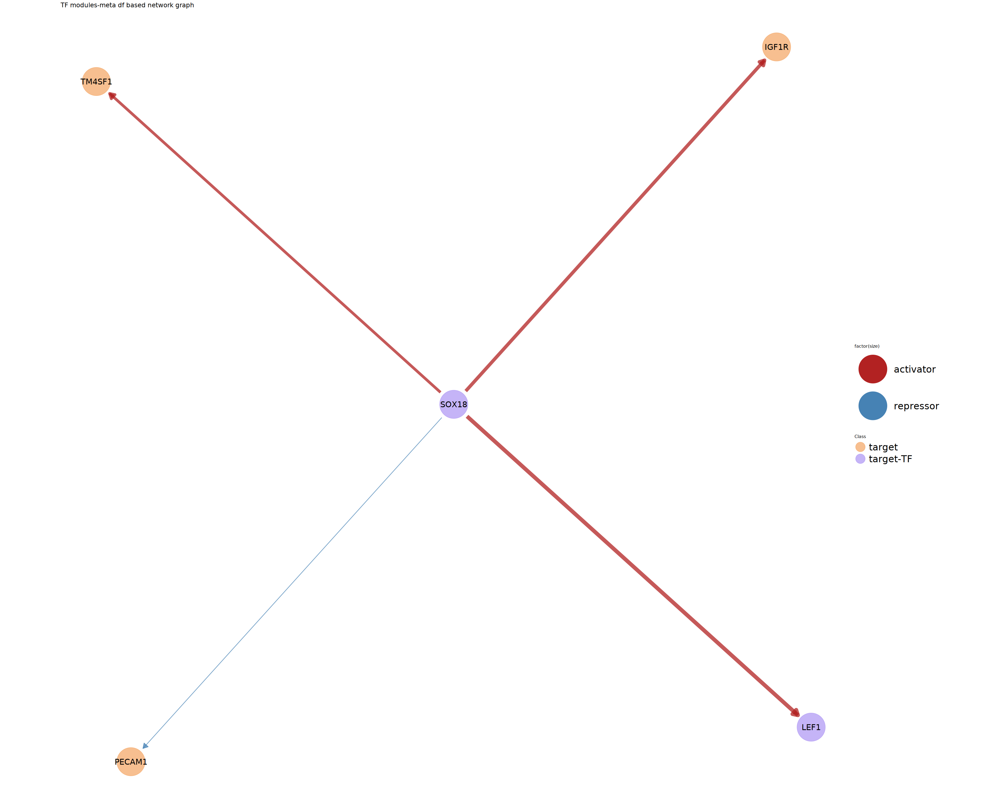

In [50]:
vis_subnetwork_w_GGNET2(meta_DF = NetworkModules(EC_eGRN_min1_Zhu_et_al)@meta, 
                     arrow = TRUE,
                     TF_names = 'SOX18',
                     target_genes = common_targets)

 Network attributes:
  vertices = 17 
  directed = TRUE 
  hyper = FALSE 
  loops = FALSE 
  multiple = FALSE 
  bipartite = FALSE 
  total edges= 16 
    missing edges= 0 
    non-missing edges= 16 

 Vertex attribute names: 
    vertex.names 

No edge attributes


Scale for size is already present.
Adding another scale for size, which will replace the existing scale.


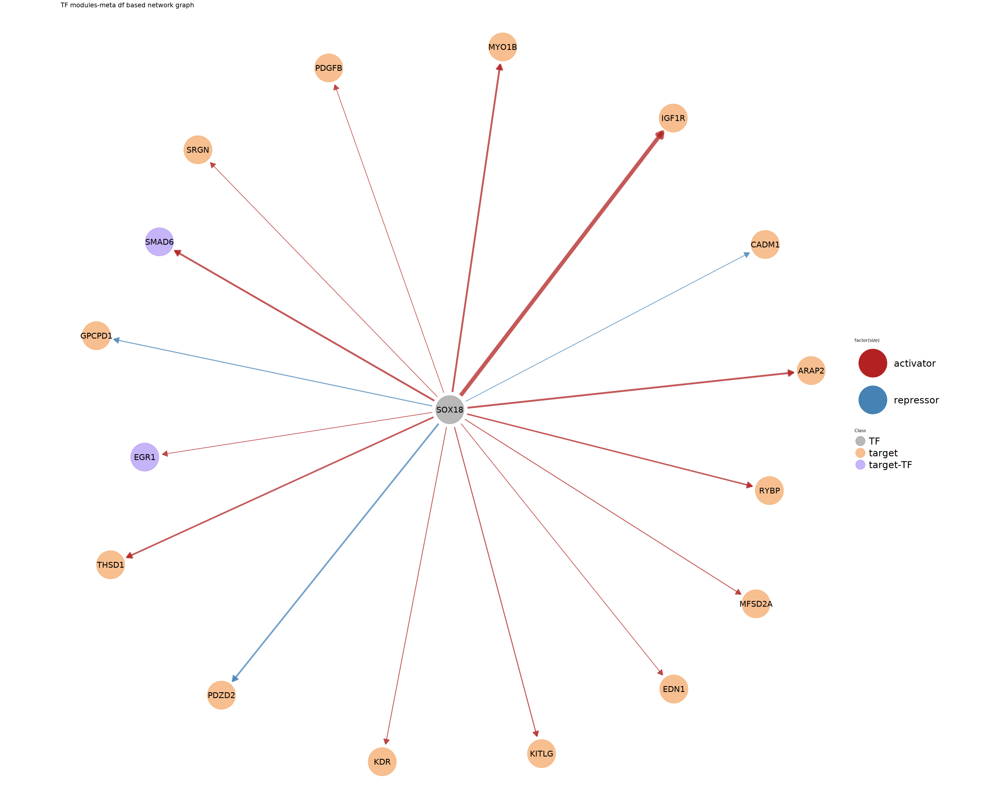

In [51]:
vis_subnetwork_w_GGNET2(meta_DF = NetworkModules(EC_eGRN_min5_Mannens_et_al)@meta, 
                     arrow = TRUE,
                     TF_names = 'SOX18',
                     target_genes = common_targets)

 Network attributes:
  vertices = 3 
  directed = TRUE 
  hyper = FALSE 
  loops = FALSE 
  multiple = FALSE 
  bipartite = FALSE 
  total edges= 2 
    missing edges= 0 
    non-missing edges= 2 

 Vertex attribute names: 
    vertex.names 

No edge attributes


Scale for size is already present.
Adding another scale for size, which will replace the existing scale.


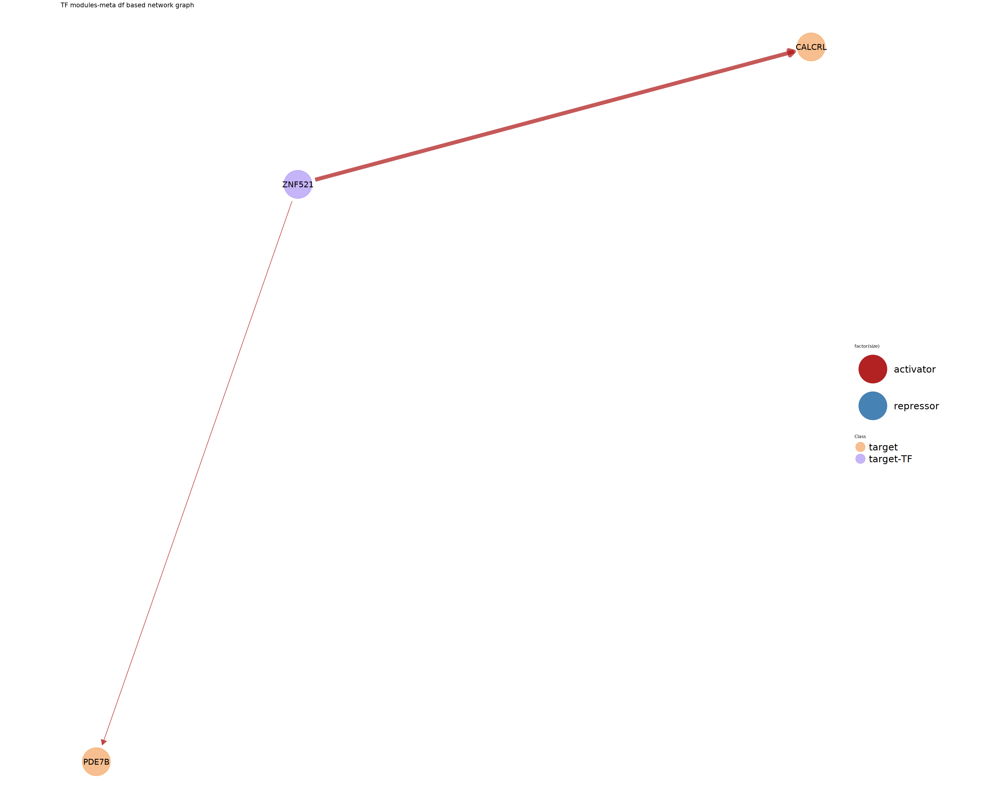

In [52]:
vis_subnetwork_w_GGNET2(meta_DF = NetworkModules(EC_eGRN_min1_Zhu_et_al)@meta, 
                     arrow = TRUE,
                     TF_names = 'ZNF521',
                     target_genes = common_targets)

 Network attributes:
  vertices = 27 
  directed = TRUE 
  hyper = FALSE 
  loops = FALSE 
  multiple = FALSE 
  bipartite = FALSE 
  total edges= 26 
    missing edges= 0 
    non-missing edges= 26 

 Vertex attribute names: 
    vertex.names 

No edge attributes


Scale for size is already present.
Adding another scale for size, which will replace the existing scale.


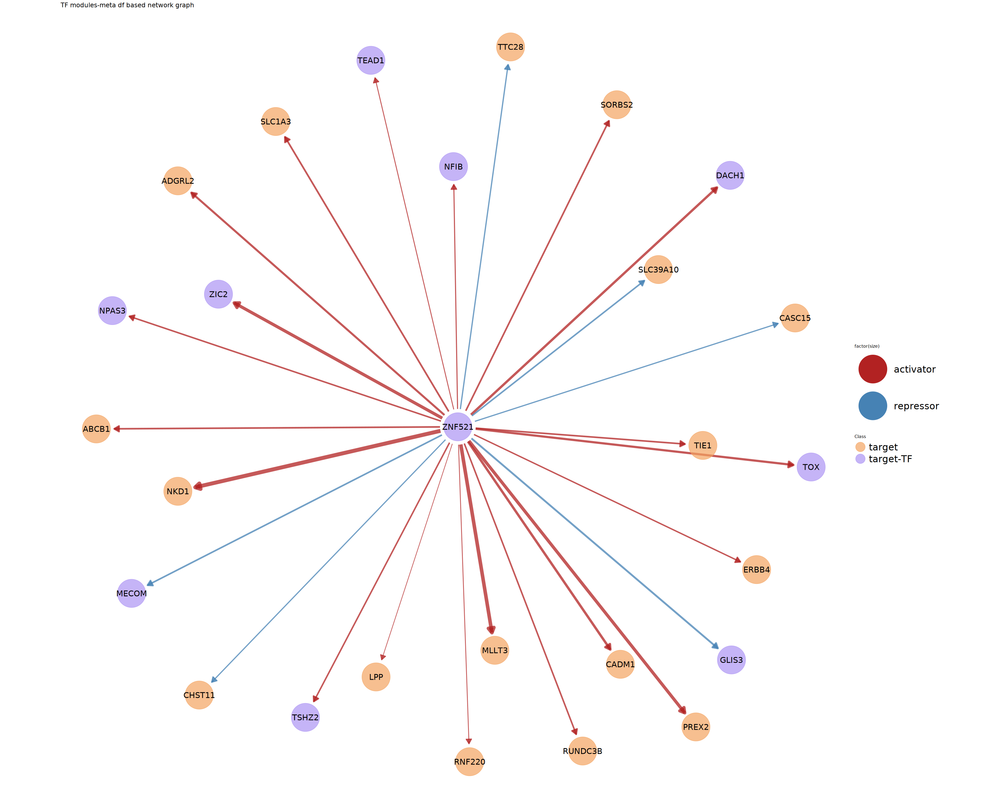

In [53]:
vis_subnetwork_w_GGNET2(meta_DF = NetworkModules(EC_eGRN_min5_Mannens_et_al)@meta, 
                     arrow = TRUE,
                     TF_names = 'ZNF521',
                     target_genes = common_targets)

In [55]:
NetworkModules(EC_eGRN_min5_Mannens_et_al)@meta %>% head

tf,target,estimate,n_regions,n_genes,n_tfs,regions,pval,padj
<chr>,<chr>,<dbl>,<int>,<int>,<int>,<chr>,<dbl>,<dbl>
ADNP,CADM1,0.05979197,28,2,34,chr11-115449145-115449546,6.661690e-03,0.0765062521
ADNP,LINC00461,0.05063886,38,2,63,chr5-87785903-87786304,5.444198e-03,0.0663392978
ALX4,COL5A2,0.14479145,2,7,7,chr2-189149967-189150368,3.963748e-03,0.0526620919
ALX4,DENND2A,0.41962847,3,7,5,chr7-139943337-139943738,4.362366e-03,0.0564851602
ALX4,EBF1,-0.84473061,27,7,36,chr5-158202046-158202447,4.302490e-03,0.0559197623
ALX4,HEY2,0.28985015,3,7,4,chr6-126143915-126144316,2.261550e-06,0.0001066292


In [56]:
NetworkModules(EC_eGRN_min1_Zhu_et_al)@meta %>% head

tf,target,estimate,n_regions,n_genes,n_tfs,regions,pval,padj
<chr>,<chr>,<dbl>,<int>,<int>,<int>,<chr>,<dbl>,<dbl>
AEBP2,ATP2B1,0.02486657,4,10,3,chr12-89707060-89707304,0.0080975973,0.061764430
AEBP2,CAMK1D,0.03421972,1,10,1,chr10-12699395-12699595,0.0006356896,0.008522961
AEBP2,CNTNAP2,0.06680273,1,10,1,chr7-148809909-148810164,0.0025240192,0.025500072
AEBP2,DMD,0.05752384,1,10,1,chrX-30992379-30992751,0.0034976167,0.032788445
AEBP2,NHSL1,-0.03879838,1,10,2,chr6-139588999-139589637,0.0006404508,0.008575795
AEBP2,PLCB1,0.07657219,3,10,3,chr20-9945452-9945665,0.0033085371,0.031437162


In [57]:
# Find TF-target pairs with same direction of interaction in two network dataframe:

# Example dataframes (replace with your actual data)
df1 <- NetworkModules(EC_eGRN_min5_Mannens_et_al)@meta
df2 <- NetworkModules(EC_eGRN_min1_Zhu_et_al)@meta

# Step 1: Find common TF-target pairs in both dataframes
common_pairs <- inner_join(df1, df2, by = c("tf", "target"), suffix = c("_df1", "_df2"))

In [58]:
common_pairs %>% head

tf,target,estimate_df1,n_regions_df1,n_genes_df1,n_tfs_df1,regions_df1,pval_df1,padj_df1,estimate_df2,n_regions_df2,n_genes_df2,n_tfs_df2,regions_df2,pval_df2,padj_df2
<chr>,<chr>,<dbl>,<int>,<int>,<int>,<chr>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<chr>,<dbl>,<dbl>
BACH1,PDGFB,0.01521458,1,22,10,chr22-39174603-39175004,4.373794e-03,5.659176e-02,0.009095507,1,3,2,chr22-39290809-39291081,7.707803e-04,9.964308e-03
BCL11A,ADGRL2,0.03859761,12,58,16,chr1-81464244-81464645,2.312295e-03,3.515336e-02,0.034769958,2,8,6,chr1-81834940-81835176,2.842405e-03,2.795505e-02
CREB5,NPAS3,0.19246505,32,22,53,chr14-32986820-32987221;chr14-33393777-33394178,4.027605e-13,5.778652e-11,0.033061154,2,6,3,chr14-32724842-32725459,6.861997e-03,5.459450e-02
DACH1,EPAS1,0.01671337,5,40,8,chr2-46259428-46259829,1.259354e-03,2.207118e-02,0.032532119,4,12,6,chr2-46259434-46259766,2.704357e-08,1.338212e-06
DACH1,GPCPD1,0.02566298,3,40,6,chr20-6575923-6576324,7.289687e-03,8.153187e-02,0.040866748,3,12,5,chr20-6575849-6576223,6.681783e-05,1.311779e-03
DACH1,ZEB2,0.04609223,27,40,32,chr2-144832060-144832461,7.619128e-03,8.409201e-02,-0.063781568,5,12,15,chr2-144444159-144444536,1.259916e-03,1.477874e-02


In [59]:
common_pairs %>% dim

[1] 70 16

In [60]:
common_pairs$tf %>% unique %>% length

[1] 47

In [61]:
common_pairs$target %>% unique %>% length

[1] 61

In [63]:
# Step 2: Filter for the same direction of interaction:

common_pairs <- common_pairs %>%
  filter(sign(estimate_df1) == sign(estimate_df2)) %>%  # Keep pairs with same sign
  mutate(direction = ifelse(estimate_df1 > 0 & estimate_df2 > 0, "UP", "DOWN"))  # Assign direction

In [64]:
common_pairs %>% dim

[1] 60 17

In [65]:
common_pairs  %>% head

tf,target,estimate_df1,n_regions_df1,n_genes_df1,n_tfs_df1,regions_df1,pval_df1,padj_df1,estimate_df2,n_regions_df2,n_genes_df2,n_tfs_df2,regions_df2,pval_df2,padj_df2,direction
<chr>,<chr>,<dbl>,<int>,<int>,<int>,<chr>,<dbl>,<dbl>,<dbl>,<int>,<int>,<int>,<chr>,<dbl>,<dbl>,<chr>
BACH1,PDGFB,0.01521458,1,22,10,chr22-39174603-39175004,4.373794e-03,5.659176e-02,0.009095507,1,3,2,chr22-39290809-39291081,7.707803e-04,9.964308e-03,UP
BCL11A,ADGRL2,0.03859761,12,58,16,chr1-81464244-81464645,2.312295e-03,3.515336e-02,0.034769958,2,8,6,chr1-81834940-81835176,2.842405e-03,2.795505e-02,UP
CREB5,NPAS3,0.19246505,32,22,53,chr14-32986820-32987221;chr14-33393777-33394178,4.027605e-13,5.778652e-11,0.033061154,2,6,3,chr14-32724842-32725459,6.861997e-03,5.459450e-02,UP
DACH1,EPAS1,0.01671337,5,40,8,chr2-46259428-46259829,1.259354e-03,2.207118e-02,0.032532119,4,12,6,chr2-46259434-46259766,2.704357e-08,1.338212e-06,UP
DACH1,GPCPD1,0.02566298,3,40,6,chr20-6575923-6576324,7.289687e-03,8.153187e-02,0.040866748,3,12,5,chr20-6575849-6576223,6.681783e-05,1.311779e-03,UP
EBF1,ETS1,0.04282842,5,85,12,chr11-128564126-128564527,1.302731e-14,2.191659e-12,0.017458952,4,26,5,chr11-128575957-128576266,2.770058e-08,1.367925e-06,UP


In [66]:
# Step 3: Create the final dataframe with common TFs, common targets, and direction

common_connections <- common_pairs %>%
  select(tf, target, direction)

In [68]:
common_connections

tf,target,direction
<chr>,<chr>,<chr>
BACH1,PDGFB,UP
BCL11A,ADGRL2,UP
CREB5,NPAS3,UP
DACH1,EPAS1,UP
DACH1,GPCPD1,UP
EBF1,ETS1,UP
EBF1,LEF1,UP
EBF1,PDZD2,UP
EBF1,STARD13,UP


IMPORTANT: BELOW, I subset the network to the common tfs and targets, however,\
this will not exclusively contain the connections of those common tfs only to the\
targets in the common_connections dataframe. For this, I will need to filter the\
network meta dfs for both common tfs and common targets in the proper order.

In [69]:
# view the common TFR-target gene connections in both networks:

 Network attributes:
  vertices = 88 
  directed = TRUE 
  hyper = FALSE 
  loops = FALSE 
  multiple = FALSE 
  bipartite = FALSE 
  total edges= 100 
    missing edges= 0 
    non-missing edges= 100 

 Vertex attribute names: 
    vertex.names 

No edge attributes


Scale for size is already present.
Adding another scale for size, which will replace the existing scale.


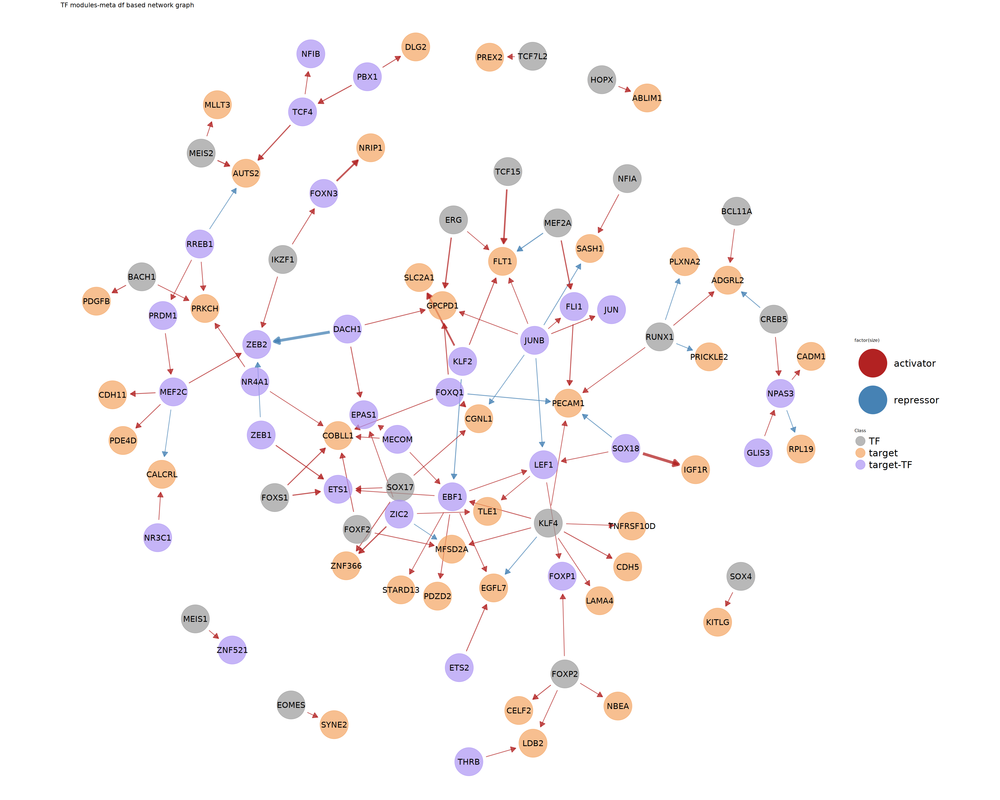

In [70]:
vis_subnetwork_w_GGNET2(meta_DF = NetworkModules(EC_eGRN_min1_Zhu_et_al)@meta, 
                     arrow = TRUE,
                     TF_names = common_connections$tf,
                     target_genes = common_connections$target)

 Network attributes:
  vertices = 88 
  directed = TRUE 
  hyper = FALSE 
  loops = FALSE 
  multiple = FALSE 
  bipartite = FALSE 
  total edges= 226 
    missing edges= 0 
    non-missing edges= 226 

 Vertex attribute names: 
    vertex.names 

No edge attributes


Scale for size is already present.
Adding another scale for size, which will replace the existing scale.


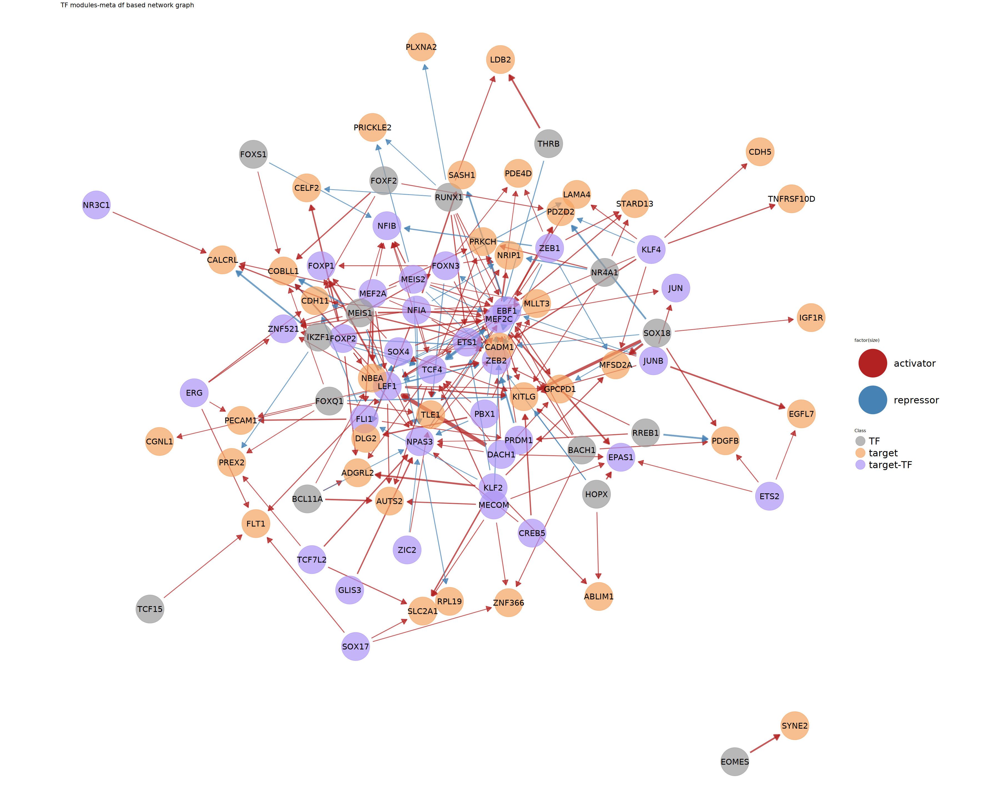

In [71]:
vis_subnetwork_w_GGNET2(meta_DF = NetworkModules(EC_eGRN_min5_Mannens_et_al)@meta, 
                     arrow = TRUE,
                     TF_names = common_connections$tf,
                     target_genes = common_connections$target)

In [72]:
common_connections$target %>% unique %>% length

[1] 53

In [73]:
common_connections$tf %>% unique %>% length

[1] 43

In [74]:
common_connections$tf %>% print

 [1] "BACH1"  "BCL11A" "CREB5"  "DACH1"  "DACH1"  "EBF1"   "EBF1"   "EBF1"  
 [9] "EBF1"   "EOMES"  "ERG"    "ETS2"   "FLI1"   "FOXF2"  "FOXN3"  "FOXP2" 
[17] "FOXP2"  "FOXP2"  "FOXQ1"  "FOXQ1"  "FOXS1"  "GLIS3"  "HOPX"   "IKZF1" 
[25] "JUNB"   "KLF2"   "KLF4"   "KLF4"   "KLF4"   "KLF4"   "KLF4"   "LEF1"  
[33] "MECOM"  "MEF2A"  "MEF2C"  "MEF2C"  "MEF2C"  "MEIS1"  "MEIS2"  "NFIA"  
[41] "NPAS3"  "NPAS3"  "NR3C1"  "NR4A1"  "PBX1"   "PBX1"   "PRDM1"  "RREB1" 
[49] "RUNX1"  "RUNX1"  "SOX17"  "SOX18"  "SOX4"   "TCF15"  "TCF4"   "TCF4"  
[57] "TCF7L2" "THRB"   "ZEB1"   "ZIC2"  


To obtain the graph with only those connections in the common_connections \
dataframe, I will filter both network meta dataframes:

In [77]:
zhu_metaDF <- NetworkModules(EC_eGRN_min1_Zhu_et_al)@meta

In [78]:
mannens_metaDF <- NetworkModules(EC_eGRN_min5_Mannens_et_al)@meta

Keep the rows that contain the exact tf-target pairs in the common_connections df:

In [81]:
zhu_metaDF <- semi_join(zhu_metaDF, common_connections, by = c("tf", "target"))

In [82]:
zhu_metaDF

tf,target,estimate,n_regions,n_genes,n_tfs,regions,pval,padj
<chr>,<chr>,<dbl>,<int>,<int>,<int>,<chr>,<dbl>,<dbl>
BACH1,PDGFB,0.009095507,1,3,2,chr22-39290809-39291081,7.707803e-04,9.964308e-03
BCL11A,ADGRL2,0.034769958,2,8,6,chr1-81834940-81835176,2.842405e-03,2.795505e-02
CREB5,NPAS3,0.033061154,2,6,3,chr14-32724842-32725459,6.861997e-03,5.459450e-02
DACH1,EPAS1,0.032532119,4,12,6,chr2-46259434-46259766,2.704357e-08,1.338212e-06
DACH1,GPCPD1,0.040866748,3,12,5,chr20-6575849-6576223,6.681783e-05,1.311779e-03
EBF1,ETS1,0.017458952,4,26,5,chr11-128575957-128576266,2.770058e-08,1.367925e-06
EBF1,LEF1,0.091839147,2,26,4,chr4-108355870-108356187,7.341556e-26,3.523648e-23
EBF1,PDZD2,0.050157097,3,26,4,chr5-32274582-32274863,1.657751e-07,6.879073e-06
EBF1,STARD13,0.024415943,2,26,2,chr13-34161981-34162303,2.424385e-04,3.867585e-03


In [83]:
mannens_metaDF <- semi_join(mannens_metaDF, common_connections, by = c("tf", "target"))

In [84]:
mannens_metaDF

tf,target,estimate,n_regions,n_genes,n_tfs,regions,pval,padj
<chr>,<chr>,<dbl>,<int>,<int>,<int>,<chr>,<dbl>,<dbl>
BACH1,PDGFB,0.01521458,1,22,10,chr22-39174603-39175004,4.373794e-03,5.659176e-02
BCL11A,ADGRL2,0.03859761,12,58,16,chr1-81464244-81464645,2.312295e-03,3.515336e-02
CREB5,NPAS3,0.19246505,32,22,53,chr14-32986820-32987221;chr14-33393777-33394178,4.027605e-13,5.778652e-11
DACH1,EPAS1,0.01671337,5,40,8,chr2-46259428-46259829,1.259354e-03,2.207118e-02
DACH1,GPCPD1,0.02566298,3,40,6,chr20-6575923-6576324,7.289687e-03,8.153187e-02
EBF1,ETS1,0.04282842,5,85,12,chr11-128564126-128564527,1.302731e-14,2.191659e-12
EBF1,LEF1,0.04150472,6,85,15,chr4-108355898-108356299,6.487005e-07,3.483051e-05
EBF1,PDZD2,0.04121712,6,85,16,chr5-31921850-31922251,2.899535e-12,3.786822e-10
EBF1,STARD13,0.02238854,3,85,6,chr13-34162033-34162434,3.107412e-03,4.392716e-02


 Network attributes:
  vertices = 6 
  directed = TRUE 
  hyper = FALSE 
  loops = FALSE 
  multiple = FALSE 
  bipartite = FALSE 
  total edges= 5 
    missing edges= 0 
    non-missing edges= 5 

 Vertex attribute names: 
    vertex.names 

No edge attributes


Scale for size is already present.
Adding another scale for size, which will replace the existing scale.


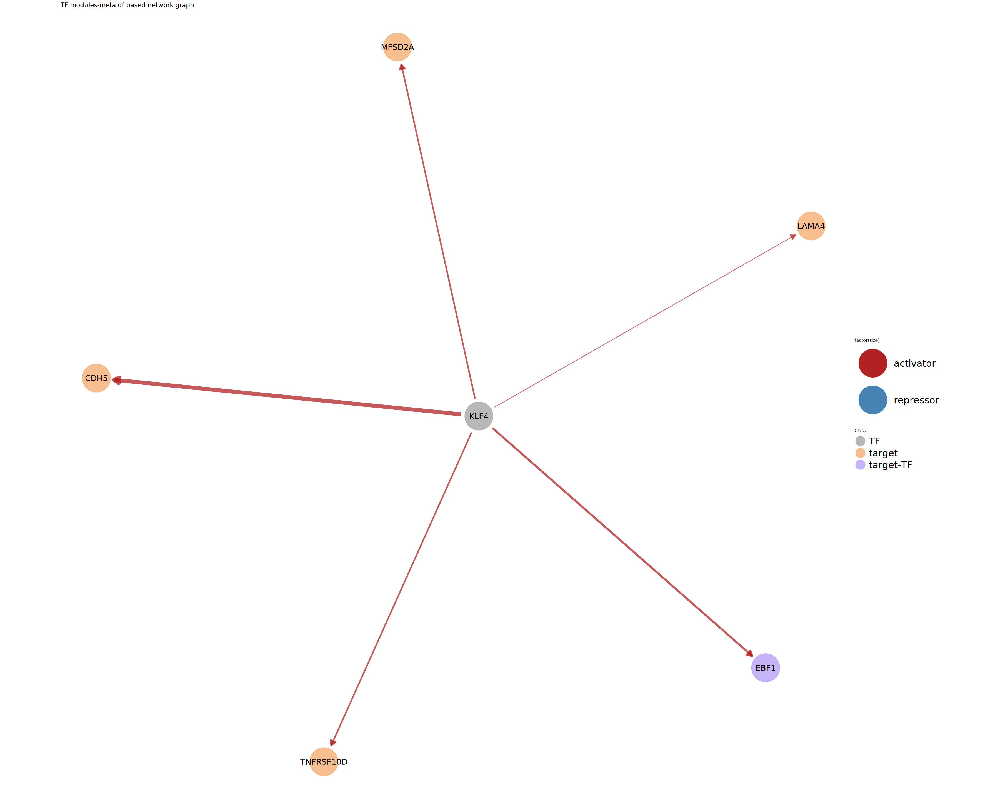

In [85]:
vis_subnetwork_w_GGNET2(meta_DF = zhu_metaDF, 
                     arrow = TRUE,
                     TF_names = 'KLF4',
                     target_genes = common_connections$target)

 Network attributes:
  vertices = 6 
  directed = TRUE 
  hyper = FALSE 
  loops = FALSE 
  multiple = FALSE 
  bipartite = FALSE 
  total edges= 5 
    missing edges= 0 
    non-missing edges= 5 

 Vertex attribute names: 
    vertex.names 

No edge attributes


Scale for size is already present.
Adding another scale for size, which will replace the existing scale.


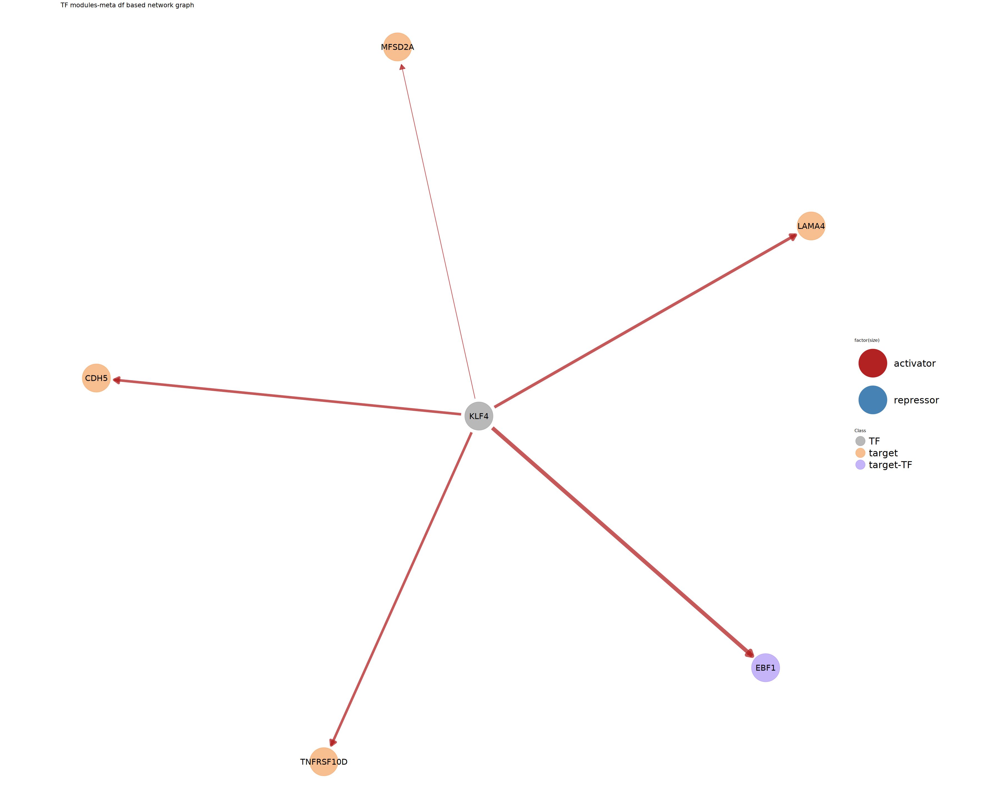

In [86]:
vis_subnetwork_w_GGNET2(meta_DF = mannens_metaDF, 
                     arrow = TRUE,
                     TF_names = 'KLF4',
                     target_genes = common_connections$target)

In [87]:
# View all common connectios in two datasets:

 Network attributes:
  vertices = 88 
  directed = TRUE 
  hyper = FALSE 
  loops = FALSE 
  multiple = FALSE 
  bipartite = FALSE 
  total edges= 60 
    missing edges= 0 
    non-missing edges= 60 

 Vertex attribute names: 
    vertex.names 

No edge attributes


Scale for size is already present.
Adding another scale for size, which will replace the existing scale.


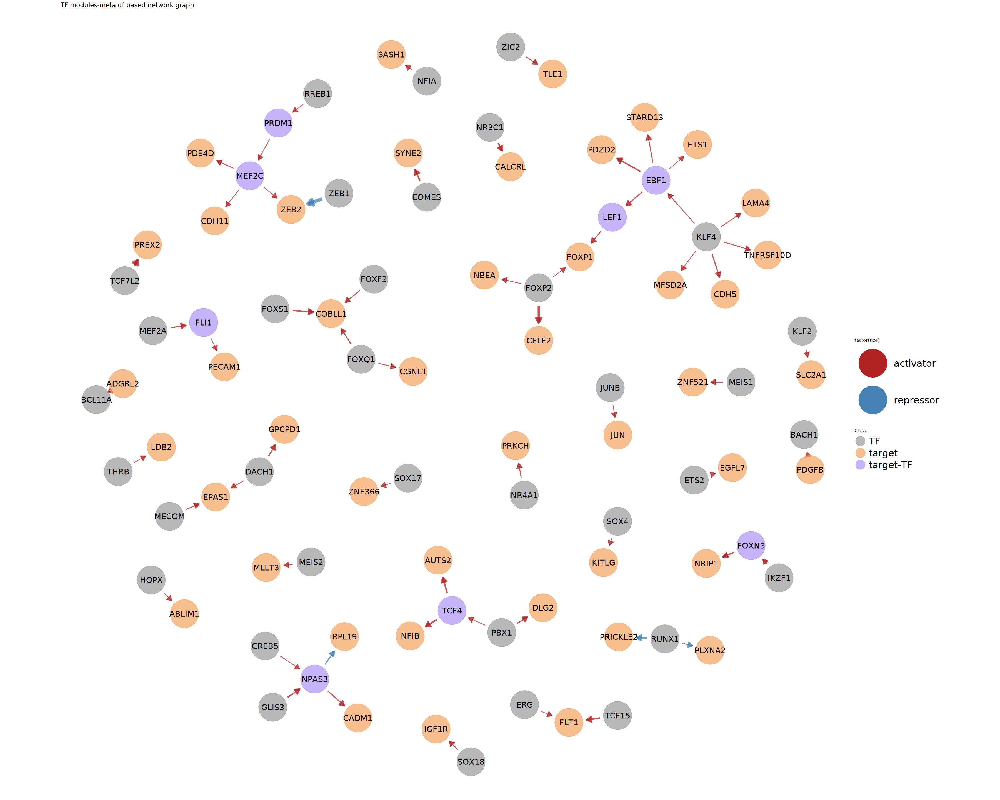

In [88]:
vis_subnetwork_w_GGNET2(meta_DF = zhu_metaDF, 
                     arrow = TRUE,
                     TF_names = common_connections$tf,
                     target_genes = common_connections$target)

 Network attributes:
  vertices = 88 
  directed = TRUE 
  hyper = FALSE 
  loops = FALSE 
  multiple = FALSE 
  bipartite = FALSE 
  total edges= 60 
    missing edges= 0 
    non-missing edges= 60 

 Vertex attribute names: 
    vertex.names 

No edge attributes


Scale for size is already present.
Adding another scale for size, which will replace the existing scale.


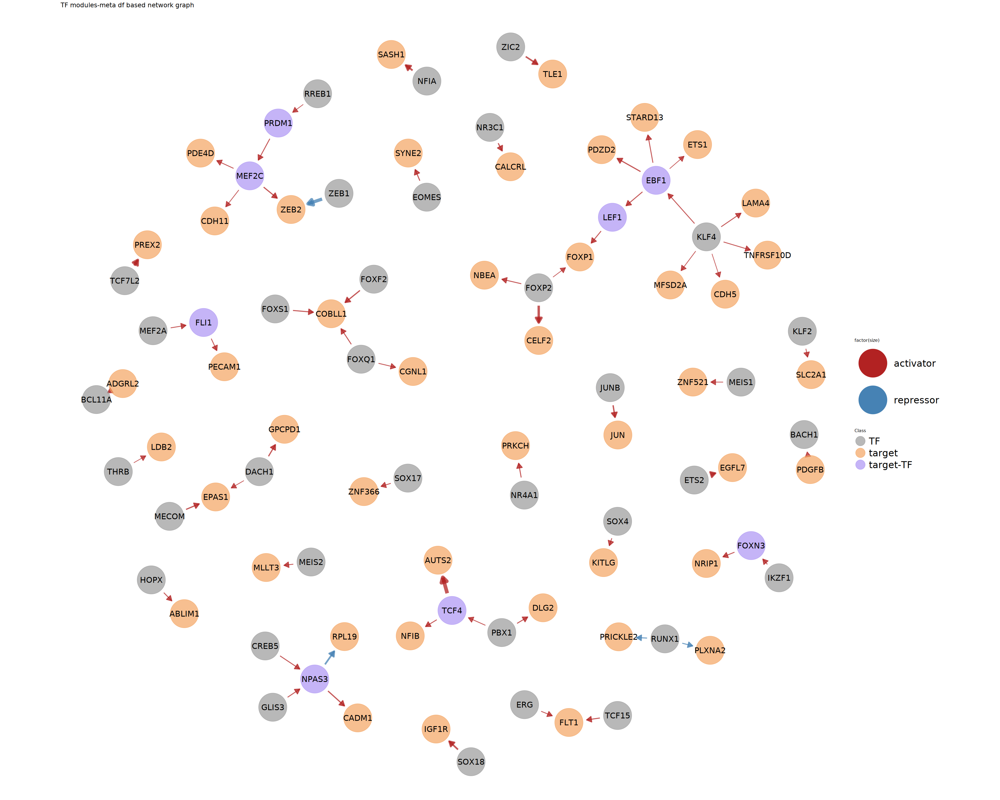

In [89]:
vis_subnetwork_w_GGNET2(meta_DF = mannens_metaDF, 
                     arrow = TRUE,
                     TF_names = common_connections$tf,
                     target_genes = common_connections$target)

In [90]:
p1 <- vis_subnetwork_w_GGNET2(meta_DF = zhu_metaDF, 
                     arrow = TRUE,
                     TF_names = 'TCF4',
                     target_genes = common_connections$target)

 Network attributes:
  vertices = 3 
  directed = TRUE 
  hyper = FALSE 
  loops = FALSE 
  multiple = FALSE 
  bipartite = FALSE 
  total edges= 2 
    missing edges= 0 
    non-missing edges= 2 

 Vertex attribute names: 
    vertex.names 

No edge attributes


Scale for size is already present.
Adding another scale for size, which will replace the existing scale.


In [91]:
p2 <- vis_subnetwork_w_GGNET2(meta_DF = mannens_metaDF, 
                     arrow = TRUE,
                     TF_names = 'TCF4',
                     target_genes = common_connections$target)

 Network attributes:
  vertices = 3 
  directed = TRUE 
  hyper = FALSE 
  loops = FALSE 
  multiple = FALSE 
  bipartite = FALSE 
  total edges= 2 
    missing edges= 0 
    non-missing edges= 2 

 Vertex attribute names: 
    vertex.names 

No edge attributes


Scale for size is already present.
Adding another scale for size, which will replace the existing scale.


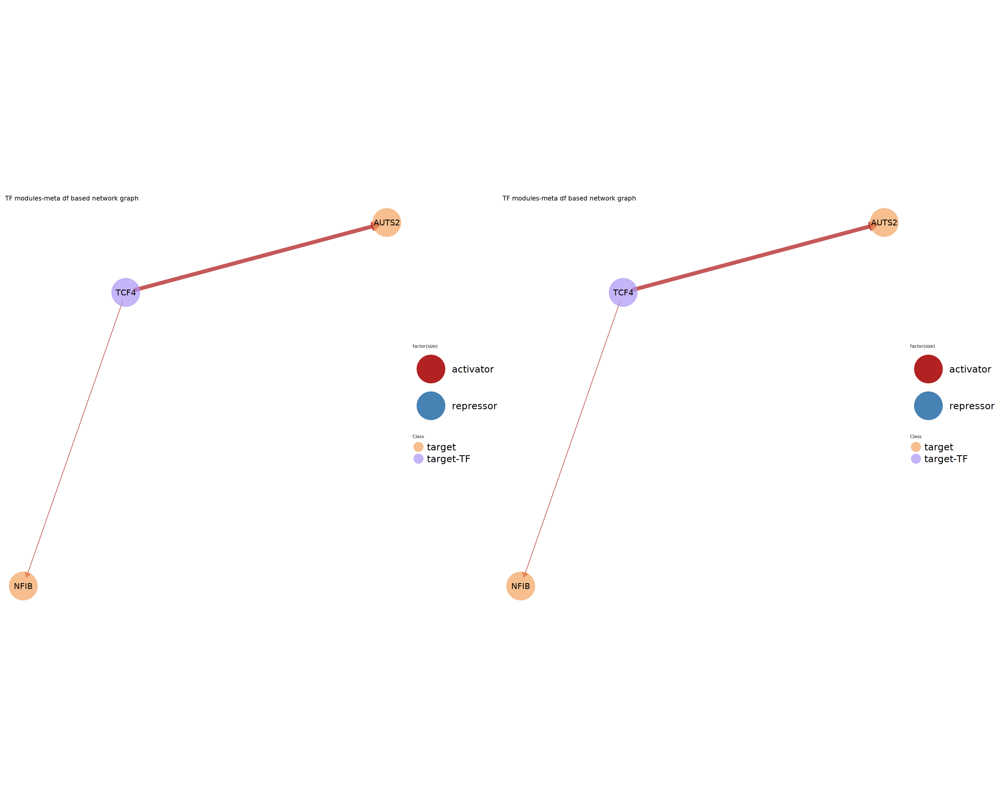

In [94]:
p1 | p2

In this notebook, I compared endothelial cell eGRNs that were generated using two different\
dataset. In the next notebook, I will perform SNP overrepresentation analysis over the \
regulatory elements in the ednothelial and other cell type specific eGRNs from zhu et al\
dataset.

In [96]:
sessionInfo()

R version 4.4.1 (2024-06-14)
Platform: x86_64-unknown-linux-gnu
Running under: Red Hat Enterprise Linux 9.4 (Plow)

Matrix products: default
BLAS/LAPACK: /gnu/store/mvbj21lcf387dgs04d29n0sxrydq03a6-openblas-0.3.20/lib/libopenblasp-r0.3.20.so;  LAPACK version 3.9.0

locale:
 [1] LC_CTYPE=en_GB.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_GB.UTF-8        LC_COLLATE=en_GB.UTF-8    
 [5] LC_MONETARY=en_GB.UTF-8    LC_MESSAGES=en_GB.UTF-8   
 [7] LC_PAPER=en_GB.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_GB.UTF-8 LC_IDENTIFICATION=C       

time zone: Europe/Berlin
tzcode source: system (glibc)

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
 [1] ggraph_2.2.1       igraph_2.0.3       network_1.18.2     GGally_2.2.1      
 [5] Pando_1.1.1        Signac_1.14.0      Seurat_5.1.0       SeuratObject_5.0.2
 [9] sp_2.1-4           lubri